<a href="https://colab.research.google.com/github/RedCloud2/logistische_Gleichung/blob/main/Tutorial_%2B_Demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <center> Chaos-Theorie und die logistische Gleichung
<div align="justify ">Die Chaos-Theorie ist ein Teilgebiet der Mathematik, das sich mit nichtlinearen dynamischen Systemen beschäftigt. Ein System ist nur eine Menge von miteinander interagierenden Komponenten, die ein größeres Gesamtbild ergeben. Nichtlinear bedeutet, dass aufgrund von Rückkopplungen oder multiplikativen Effekten zwischen den Komponenten das Gesamtsystem zu etwas Größerem wird, als wenn man die einzelnen Teile addiert. Und schließlich bedeutet dynamisch, dass sich das System im Laufe der Zeit basierend auf seinem aktuellen Zustand verändert.Im folgenden Beitrag werden wir einige dieser Fachbegriffe aufschlüsseln, interessante Merkmale des Chaos visualisieren und seine Auswirkungen auf Wissen und Vorhersage diskutieren. <a href=“https://en.wikipedia.org/wiki/Edward_Norton_Lorenz“> Edward N.Lorenz</a> difiniert wie folgt die Chaos-Theorie: <i>"When the present determines the future, but the approximate present does not approximately determine the future."</i></div>

In [ ]:
#@title  { display-mode: "code" }
# Imports 
import ipywidgets 
from matplotlib import animation, rc
import matplotlib.pyplot as plt
import matplotlib.widgets
import numpy as np
from IPython.display import display
from IPython.display import HTML
import collections
import functools
import seaborn as sns

# Widgets
r_widget = ipywidgets.widgets.FloatSlider(
    value=0.5,
    min=0,
    max=4.0,
    step=0.01,
    description='r',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='.2f',
    layout=ipywidgets.Layout(width='auto', height='auto')
)

anfangwert_widget = ipywidgets.widgets.FloatSlider(
    value=0.5,
    min=0.0,
    max=1.0,
    step=0.01,
    description='Anfangwert',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='.2f',
    layout=ipywidgets.Layout(width='auto', height='auto')
)

is_saved_widget = ipywidgets.widgets.Checkbox(
    value=False,
    description='letzten Graph speichern?',
    disabled=False
    
)

anfangwert_textbox=ipywidgets.widgets.BoundedFloatText(
     value=0.5,
    min=0.0,
    max=1.0,
    step=0.01,
    description='Anfangswert:',
    disabled=False
    #layout=ipywidgets.Layout(width='auto', height='auto')
)

r_textbox=ipywidgets.widgets.BoundedFloatText(
     value=0.5,
    min=0.0,
    max=4.0,
    step=0.01,
    description='r:',
    disabled=False
    #layout=ipywidgets.Layout(width='auto', height='auto')
)

##Variablen, Funktionen und Konstaten

#logistische Gleichung
def logistische_gleichung (x, r):
  y = r * x * (1 - x)
  return y


#logistische Gleichung Iterationen
def logistische_gleichung_iteration (startwert, r , iterrationen = 250):
  result_list = []
  result_list.append(startwert)
  for i in range(iterrationen-1) :
    x = logistische_gleichung (startwert, r)
    result_list.append(x)
    startwert = x
  return result_list

#Fixpunkte

def fix_punkte (r, schritte = 1000,  gleitkommagenauigkeit = 0.001 ):
  werte = []
  rounded_values = []
  if r < 1:
    werte.append(float(0.0))
    rounded_values = []
  elif  r < 3:
    werte.append(float("%.4f" % ((r-1)/r)))
    rounded_values = werte

  else:
    gleitkommagenauigkeit = 0.02
    x = 0.5
    liste = []
    
    for i in range(schritte):
      x = r * x * (1-x)
      liste.append(float("%.4f" % x))

    werte = [i for i, count in collections.Counter(liste).items() if count > 1]

    rounded_values = functools.reduce(lambda x, y: x + [y] if len(x) == 0 or y > x[-1] + gleitkommagenauigkeit else x, sorted(werte), [])

  return werte, rounded_values


#save the last graph
list_of_graphs = []
is_saved = False

## <center> Die logistische Gleichung

In [ ]:
#@title 
#Plotting
#@ipywidgets.widgets.interact(anfangswert = anfangwert_widget, r = r_widget , is_saved = is_saved_widget)
def plot_lg (anfangswert, r ,  is_saved = False):
  iterrationen = 250
  x = np.linspace(0, iterrationen, iterrationen)
  fig, ax = plt.subplots(figsize=(25,10), dpi= 65)
  fix_punkte_list, rounded_punkte_list =  fix_punkte(r)
  if is_saved == False:
    result_lg = logistische_gleichung_iteration(anfangswert, r)
    list_of_graphs.append(tuple((x ,result_lg, r, anfangswert)))
    ax.plot(x, result_lg, '-o' ,color='k' , lw='0.9' ,label = "r= "+str(r)+" X0= "+ str(anfangswert))
  
  elif is_saved == True:
    if len(list_of_graphs) > 1:
      ax.plot(list_of_graphs[-1][0], list_of_graphs[-1][1] ,'-s',  color='r', label = "r= "+str(list_of_graphs[-1][2])+" X0= "+ str(list_of_graphs[-1][3]))

    result_lg = logistische_gleichung_iteration(anfangswert, r)
    list_of_graphs.append(tuple((x ,result_lg, r, anfangswert)))
    ax.plot(x, result_lg,'--o', color='k',label= "r= "+str(r)+" X0= "+ str(anfangswert))
  


  ax.set(xlabel='Iterationen', ylabel='X',
       title='Logistische Gleichung')
  ax.legend()
  ax.minorticks_on()
  ax.grid(which='minor', alpha=0.5)
  ax.grid(which='major', alpha=0.5)
  plt.show()
  print('Fix-Punkte r= ' + str(r) +': ')
  print(np.array(rounded_punkte_list))


ineteract_1 = ipywidgets.widgets.interactive_output(plot_lg, {'anfangswert':anfangwert_widget, 'r':r_widget, 'is_saved':is_saved_widget})

ineteract_2 = ipywidgets.widgets.interactive_output(plot_lg, {'anfangswert':anfangwert_textbox, 'r':r_textbox, 'is_saved':is_saved_widget})



widget_1_hbox = ipywidgets.HBox([r_textbox, anfangwert_textbox, is_saved_widget])
widget_1_hbox.layout.width = 'auto'
widget_1_hbox.layout.height = 'auto'

widget_1_vbox = ipywidgets.VBox([widget_1_hbox, ineteract_2])
widget_1_vbox.layout.width = 'auto'
widget_1_vbox.layout.height = 'auto'

widget_vbox = ipywidgets.VBox([r_widget, anfangwert_widget, is_saved_widget, ineteract_1])
widget_vbox.layout.width = 'auto'
widget_vbox.layout.height = 'auto'


tab_nest = ipywidgets.widgets.Tab()
tab_nest.children = [widget_vbox, widget_1_vbox]
tab_nest.set_title(0, 'Sliders')
tab_nest.set_title(1, 'Textbox')


   
grid = ipywidgets.GridspecLayout(9, 6, justify_content= 'center', align_itemes='center' , width='150',   height='1000px')
grid[0,0:3]= ipywidgets.Label('Verhalten der logistischen Gleichung in Abhängigkeit von r und X0')
grid[1:8,0:5]= tab_nest



grid

GridspecLayout(children=(Label(value='Verhalten der logistischen Gleichung in Abhängigkeit von r und X0', layo…

### <center> Herleitung

<div align="justify ">Die logistische Gleichung wurde im Zusammenhang mit der Populationsentwicklung aufgestellt.  
Eine Population hat eine Größe X, welche sich um einen Wert r ändert.  
Also im nächsten Jahr gibt es eine Population X<sub>n+1</sub>=r * X<sub>n</sub>.  
Dies würde zu einene exponetiellen Wachstum führen =>  X<sub>n</sub>= r<sup>n</sup> * X<sub>0</sub>.  
Man kann sich leicht ausrechnen, dass bei exponentiellem Wachstum ohne dichtebegrenzende Faktoren bereits nach einigen Jahren der gesamte Erdball mit der Spezies überdeckt sein würde. Die Formel beschreibt die Population also noch nicht korrekt. Es fehlt ein "Bremsfaktor". Betrachten wir einmal das Nahrungsangebot als wachstumsbegrenzenden Faktor:
Steigt die Größe der Population, so tritt Nahrungsmangel auf. Das Ökosystem ist an seine Belastbarkeitsgrenze gelangt, viele verhungern. Also gibt es eine maximale Population X<sub>max</sub>, die durch Umgebung begrenzt wird.  
Deswegen wird nicht mit den genauen Populationsanzhal gerechnet, sondern mit dem Anteil zur maximalen Population. x<sub>n</sub> = X<sub>n</sub>/X<sub>max</sub>.  
Damit eine keine Exponetielles Wachstum stattfindet wird eine Rückkopplung eingebaut, dadurch sinkt bei höherer Population das Wachstum.  

x<sub>n</sub> = r \* x<sub>n</sub> \* (1 - x<sub>n</sub>)  

Im folgenden Diagramm ist die logistische Gleichung abgebildet:
Auf der Horizonatlen Achse ist die aktuelle Population  
Auf der Vertikalen Achse ist die Population im nächsten Jahr  

Die Population wird im Intervall [0;1] angegeben (Anteil der Populationm zur Maximalen).  

Die Wachstumänderung r wird im Intervall [0;4], r-Wert außerhalb des Intervalls würden dazu führen, dass die Population den Intervall [0;1] verlässt.</i></div>

In [ ]:
#@title
####Tutorial

###Kapitel 1: Logistische Gleichung

##Funktion zum animieren der logistischen Funktion
def logistische_gleichung_animiert ():

  fig, ax = plt.subplots()
  plt.close()
  fig.suptitle('logistische Gleichung: $x_{n+1}=r*x_n*(1-x_n)$', fontsize=14, fontweight='bold')

  ax.set_xlim((0.,1.))
  ax.set_ylim((0.,1.1))

  ax.set_xlabel("Population im aktuellen Jahr")
  ax.set_ylabel("Population im nächsten Jahr")

  ax.minorticks_on()
  ax.grid(which='minor', alpha=0.5)
  ax.grid(which='major', alpha=0.5)

  lg_plot, = ax.plot([],[])
  r_text = ax.text(0.1,0.8,'', fontsize=15)

  def init():
      lg_plot.set_data([],[])
      return(lg_plot,)

  def animate(i):
      
      x = np.arange(0.,1.,0.001)
      y = logistische_gleichung(x,i)

      lg_plot.set_data(x,y)

      r_text.set_text("r = " + str(round(i,1)))

      return (lg_plot, r_text,)

  anim = animation.FuncAnimation(fig, animate, init_func=init,
                              frames=np.arange(0.0, 4.1, 0.1), interval=200, blit=True)

  rc('animation', html='jshtml')
  return anim

##Aufrufen der Animation


lg_animiert = logistische_gleichung_animiert()
HTML(lg_animiert.to_html5_video())

### <center> Iteration


<div align="justify ">Um den Verlauf der Population nachzuvollziehen, wird nun der ein Startwert ausgewählt. Zum Beispiel 20% der maximal Population und einen r-Wert von 2.8.  
Der errechnete Populationswert wird dann als Eingabe für die nächste Iteration genommen.  
Wie in dem Graphen zu erkennem, stabelisiert sich die Population bei 66%.  
Der obere Graph zeigt den Verlauf der Population und der untere Graph die aktuelle Pupulation auf der logistischen Gleichung. </i></div> 

In [ ]:
#@title  { display-mode: "code" }
def logistische_gleichung_iteration_combined():

  fig = plt.figure()

  ax1 = fig.add_subplot(2,1,1)
  ax2 = fig.add_subplot(2,1,2)

  plt.close()

  fig.suptitle('Iteration der logistischen Gleichung', fontsize=14, fontweight='bold')

  ax1.set_xlim((0.,30.))
  ax1.set_ylim((0.,1.1))

  ax1.set_xlabel("Anzahl an Iterationen : vergangene Jahre")
  ax1.set_ylabel("Population")

  ax1.minorticks_on()
  ax1.grid(which='minor', alpha=0.5)
  ax1.grid(which='major', alpha=0.5)

  ax2.set_xlim((0.,1.))
  ax2.set_ylim((0.,1.1))

  ax2.set_xlabel("Population im aktuellen Jahr")
  ax2.set_ylabel("Population im nächsten Jahr")

  ax2.minorticks_on()
  ax2.grid(which='minor', alpha=0.5)
  ax2.grid(which='major', alpha=0.5)

  lgi_plot, = ax1.plot([],[])
  lgi_text = ax1.text(5,0.8,'Anfangswert = 0.2, r = 2.8', fontsize=15)

  x_ax2 = np.arange(0.,1.,0.001)
  y_ax2 = logistische_gleichung(x_ax2,2.8)

  ax2.plot(x_ax2,y_ax2)

  redDot, = ax2.plot([0],[0],'ro')

  def init():
      lgi_plot.set_data([],[])
      return(lgi_plot,)

  def animate(i):
      
      x = np.arange(0,i)
      y = logistische_gleichung_iteration (0.2,2.8,i)

      lgi_plot.set_data(x,y)

      x=0.2
      for j in range (0,i):
        x = logistische_gleichung (x,2.8)    

      y = logistische_gleichung (x,2.8)

      redDot.set_data(x,y)

      return (lgi_plot, redDot,)

  anim = animation.FuncAnimation(fig, animate, init_func=init,
                              frames=np.arange(0, 30), interval=200, blit=True)

  rc('animation', html='jshtml')

  return anim

lg_animiert_comb = logistische_gleichung_iteration_combined()

HTML(lg_animiert_comb.to_html5_video())

## <center> Verlauf der logistischen Gleichung

In [ ]:
#@title 
####
#Animation Block
fig_animation, ax1 = plt.subplots(figsize=(20,10), dpi= 50)
plt.close()
def init():
    line.set_data([], [])
    return (line,)

def animate(i):
    x = np.linspace(0, 250, 250)
    y = logistische_gleichung_iteration(0.5, i/50)
    line.set_data(x, y)
    return (line,)

ax1.set_xlim(( 0, 250))
ax1.set_ylim((0, 1))
ax1.set(xlabel='Itterationen', ylabel='X',
       title='Logistische Gleichung')

ax1.minorticks_on()
ax1.grid(which='minor', alpha=0.5)
ax1.grid(which='major', alpha=0.5)

line, = ax1.plot([], [], '-o' ,color='k' , lw='0.9')
anim = animation.FuncAnimation(fig_animation, animate, init_func=init,
                             frames=200, interval=200, blit=True)

rc('animation', html='jshtml')
anim
####

### <center> Verlauf bei verschiedener Anfangspopulation

<div align="justify "> Wir haben unsere beiden Parameter x<sub>0</sub> (Anfangspopulation) und r (Wachstumsrate).  
Jetzt ist von Iteresse, wie diese Parameter unsere Iterationen verändern.  Als erstes schauen wird uns die Anfangspopulation an, in der Animation sehen wir, dass der langfristige Verlauf der Population nicht von der Anfangspopulation abhängt, sondern, dass jeder Verlauf den selben Wert anstrebt. (Ausnahmen sind x<sub>0</sub>=0 & x<sub>0</sub>=1 => führt zum Aussterben der Population)</i></div>

In [ ]:
#@title 
### Kapitel 3: Anfangswert

##Funktion zum animieren der Iterationen mit verschiedenen Anfangswerten

def lgi_anfangswert_animiert():

  fig, ax = plt.subplots()
  plt.close()
  fig.suptitle('Iteration bei verschiedenen Anfangswerte', fontsize=14, fontweight='bold')

  ax.set_xlim((0.,30.))
  ax.set_ylim((0.,1.1))

  ax.set_xlabel("Anzahl an Iterationen : vergangene Jahre")
  ax.set_ylabel("Population")

  ax.minorticks_on()
  ax.grid(which='minor', alpha=0.5)
  ax.grid(which='major', alpha=0.5)

  lgi_plot, = ax.plot([],[])
  lgi_text = ax.text(5,0.8,'Anfangswert = , r = 2.8', fontsize=15)

  def init():
      lgi_plot.set_data([],[])
      return(lgi_plot,)

  def animate(i):
      
      x = np.arange(0,30)
      y = logistische_gleichung_iteration (i,2.8,30)

      lgi_plot.set_data(x,y)
      
      lgi_text.set_text('Anfangswert = ' + str(round(i,1)) + ', r = 2.8')

      return (lgi_plot, lgi_text,)

  anim = animation.FuncAnimation(fig, animate, init_func=init,
                              frames=np.arange(0., 1., 0.1), interval=300, blit=True)

  rc('animation', html='jshtml')

  return anim

lgi_aw_animiert = lgi_anfangswert_animiert()

HTML(lgi_aw_animiert.to_html5_video())

### <center> Verlauf bei verschiedenen R-Werten

<div align="justify ">Jetzt wo wir wissen, dass die Anfangspopulation kein Einfluss auf den Populationsverlauf, wird sich r näher angschaut.</i></div>

In [ ]:
#@title 
### Kapitel 4: R-Wert

##Funktion zum animieren der Iterationen mit verschiedenen Anfangswerten

def lgi_rWert_animiert():

  fig, ax = plt.subplots()
  plt.close()
  fig.suptitle('Iteration bei verschiedenen R-Werte', fontsize=14, fontweight='bold')

  ax.set_xlim((0.,50.))
  ax.set_ylim((0.,1.1))

  ax.set_xlabel("Anzahl an Iterationen : vergangene Jahre")
  ax.set_ylabel("Population")

  ax.minorticks_on()
  ax.grid(which='minor', alpha=0.5)
  ax.grid(which='major', alpha=0.5)

  lgi_plot, = ax.plot([],[])
  lgi_text = ax.text(5,1.1,'Anfangswert = 0.5, r = ', fontsize=15)

  def init():
      lgi_plot.set_data([],[])
      return(lgi_plot,)

  def animate(i):
      
      x = np.arange(0,50)
      y = logistische_gleichung_iteration (0.5,i,50)

      lgi_plot.set_data(x,y)
      lgi_text.set_text('Anfangswert = 0.5, r = ' + str(round(i,2)))

      return (lgi_plot, lgi_text,)

  anim = animation.FuncAnimation(fig, animate, init_func=init,
                              frames=np.arange(0., 4., 0.02), interval=200, blit=True)

  rc('animation', html='jshtml')

  return anim

lgi_rw_animiert = lgi_rWert_animiert()

HTML(lgi_rw_animiert.to_html5_video())

<div align="justify ">Aus der Animation sind folgende Phänome zu sehen:
1. 0 ≤ r ≤ 1: Die Population ist zum Aussterben verurteilt. Dabei ist es völlig egal, mit welcher Anfangspopulation die Spezies ins Rennen gehen. Nach einigen Jahren strebt die Population stets gegen 0.  
Dort liegt noch eine Besonderheit vor: Sobald ein x<sub>n</sub> den Wert 0 exakt annimmt, ist natürlich auch x<sub>n+1</sub> = r·(1-0)·0 = 0 und damit auch x<sub>n+2</sub> usw. Die Iteration bleibt auf der 0 festgenagelt und kommt nie wieder von ihr los. Die 0 ist ein Fixpunkt.
2.  1 < r ≤ 3: Die Gefahr des Aussterbens ist gebannt. Die 0 hat an Attraktivität verloren. Selbst Werte ganz nahe an 0 wenden sich sofort ab. Natürlich bleibt 0 Fixpunkt, also falls 0 erreicht wird, bleibt die Population ausgestoorben. Die Population strebt aber nicht nach 0, sondern zu einen weiterer Fixpunkt = (r-1)/r, dem die Folgenglieder nun (wieder unabhängig von x<sub>0)</sub> zustreben.
3. 3 < r ≤ 4: Ab diesen Zeitpunkt strebt die Popualtion nicht mehr ein Fixpunkt an, sondern wiederhohlt sich Periodisch. Erst mit zweier Perioden, dann vierer, achter, usw.. Bis schließlich das Chaos ausbricht und keine Perioden mehr zu erkennen sind. 
Fixpunkte der logistischen Gleichung: 
$$[1]\;\; X_{n}=0$$
$$[2]\;\; ;X_{n+1}=X_n$$
$$\;\; 1 = r(1-x_n) \iff x_n = \frac{r-1}{r}.$$</i></div>

## <center> Bifraktions-Diagramm

In [ ]:
#@title 

#Widgets
r_1_widget = ipywidgets.widgets.FloatSlider(
    value=0.5,
    min=0,
    max=4.0,
    step=0.01,
    description='r',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='.2f',
    layout=ipywidgets.Layout(width='auto', height='auto')
)

anfangwert_1_widget = ipywidgets.widgets.FloatSlider(
    value=0.5,
    min=0.0,
    max=1.0,
    step=0.01,
    description='Anfangwert',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='.2f',
    layout=ipywidgets.Layout(width='auto', height='auto')
)

anfangwert_1_textbox=ipywidgets.widgets.BoundedFloatText(
     value=0.5,
    min=0.0,
    max=1.0,
    step=0.01,
    description='Anfangswert:',
    disabled=False
    #layout=ipywidgets.Layout(width='auto', height='auto')
)

r_1_textbox=ipywidgets.widgets.BoundedFloatText(
     value=0.5,
    min=0.0,
    max=4.0,
    step=0.01,
    description='r:',
    disabled=False
    #layout=ipywidgets.Layout(width='auto', height='auto')
)

def bifraction_diagram(anfangswert, r):
    lg_werte = logistische_gleichung_iteration(anfangswert,r)
    x = np.linspace(0,250,250)
    fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(30, 10))
    s= 100

    for i in np.arange(0,4,0.01):
      liste=[]
      rounded_fix_punkte = []
      liste, rounded_fix_punkte = fix_punkte(i)
      if liste == [] and not i==r:
        ax2.scatter(i, 0.0 , marker='^' ,color='k')

      if liste == [] and i==r:
        ax2.scatter(i, 0.0 , s=s ,color='r')

      if i == r:
        ax2.scatter([i]* len(rounded_fix_punkte), rounded_fix_punkte ,s=s, marker='o', color='r')
      
      ax2.scatter([i]* len(liste), liste, marker='^', color='k')


    ax1.plot(x, lg_werte,'-o' ,color = 'k')

    ax1.minorticks_on()
    ax1.grid(which='minor')
    ax1.grid(which='major')
    ax2.minorticks_on()
    ax2.grid(which='minor')
    ax2.grid(which='major')
    plt.show()



ineteract1_1 = ipywidgets.widgets.interactive_output(bifraction_diagram, {'anfangswert':anfangwert_1_widget, 'r':r_1_widget})

ineteract1_2 = ipywidgets.widgets.interactive_output(bifraction_diagram, {'anfangswert':anfangwert_1_textbox, 'r':r_1_textbox})



widget1_1_hbox = ipywidgets.HBox([r_1_textbox, anfangwert_1_textbox])
widget1_1_hbox.layout.width = 'auto'
widget1_1_hbox.layout.height = 'auto'

widget1_1_vbox = ipywidgets.VBox([widget1_1_hbox, ineteract1_2])
widget1_1_vbox.layout.width = 'auto'
widget1_1_vbox.layout.height = 'auto'

widget1_vbox = ipywidgets.VBox([r_1_widget, anfangwert_1_widget, ineteract1_1])
widget1_vbox.layout.width = 'auto'
widget1_vbox.layout.height = 'auto'


tab_1_nest = ipywidgets.widgets.Tab()
tab_1_nest.children = [widget1_vbox, widget1_1_vbox]
tab_1_nest.set_title(0, 'Sliders')
tab_1_nest.set_title(1, 'Textbox')


   
grid_1 = ipywidgets.GridspecLayout(9, 6, justify_content= 'center', align_itemes='center' , width='150',   height='800px')
grid_1[0:1,0:3]= ipywidgets.Label('')
grid_1[2:8,0:5]= tab_1_nest



grid_1

GridspecLayout(children=(Label(value='', layout=Layout(grid_area='widget001')), Tab(children=(VBox(children=(F…

In [ ]:
#@title 
####
#Animation Block
x_data = []
y_data = []

fig_animation_1, ax2 = plt.subplots(figsize=(20,10), dpi= 50)
plt.close()
ax2.set_xlim(( 0, 4))
ax2.set_ylim((0, 1))
ax2.set(xlabel='$r$', ylabel='X',
       title='Bifraction Diagram')
ax2.minorticks_on()
ax2.grid(which='minor', alpha=0.5)
ax2.grid(which='major', alpha=0.5)

def init():
    line.set_data([], [])
    return (line,)


line, = ax2.plot(0, 0)

def animate_1(i):
    liste=[]
    rounded_fix_punkte = []
    liste, rounded_fix_punkte = fix_punkte(i)
    if liste == []:
      x_data.append(i)
      y_data.append(0)
    else:
      x_data.extend([i]* len(liste))
      y_data.extend(liste)

    line.set_data(x_data, y_data)
    return (line,)

line, = ax2.plot([], [], 'o')

anim = animation.FuncAnimation(fig_animation_1, animate_1, 
                             frames=np.arange(0,4, 0.01), interval=500, blit=True)

rc('animation', html='jshtml')
anim

### <center> Bifraktions-Diagramm Erklärung

<div align="justify ">Die Ergebnisse wurden vom Pyhsiker Feigenbaum in einem Diagramm zusammengefasst.  
Die Idee ist es jedes r die logistische Gleichung 3000mal zu iterieren, zu diesen Zeitpunkt sollte alle Fixpunkte erreicht sein. Die häufigsten Punkte werden dann im Diagramm angezeigt.
Wir erkennen die bereits festgestellten Phänomene wieder:

1. 0 ≤ r ≤ 1: Die Population stirbt aus.
2. 1 < r ≤ 3: Die Populationsgröße nimmt (praktisch) den Attraktorwert pr = 1 - 1/r an.
3. 3 < r ≤ 4: Die Populationsgröße schwankt in einem 2er-, 4er-, 8er-, usw. Zyklus bis zu einem gewissen Punkt auf der r-Achse. Die x<sub>n</sub> Werte hüpfen ziellos auf und ab, d.h. die Populationsgröße variiert von Jahr zu Jahr völlig unregelmäßig, bis schließlich bei r = 4 alle möglichen Populationszahlen von 0 bis 1 auftreten. Chaos bricht aus.</i></div>

In [ ]:
#@title 
### Kapitel 6: Feigenbaum

def feigenbaum_diagram():
  x_data = []
  y_data = []

  fig, ax = plt.subplots()
  plt.close()
  fig.suptitle('Bifraktions-Diagramm', fontsize=14, fontweight='bold')

  ax.set_xlim((0., 4.))
  ax.set_ylim((0., 1.))

  ax.set_xlabel("R-Wert")
  ax.set_ylabel("Fixpunkte")

  ax.minorticks_on()
  ax.grid(which='minor', alpha=0.5)
  ax.grid(which='major', alpha=0.5)

  feigen_plot, = ax.plot([],[])

  def init():
      feigen_plot.set_data([], [])
      return (feigen_plot,)

  def animate(i):
      liste=[]
      rounded_fix_punkte = []
      liste, rounded_fix_punkte = fix_punkte(i)
      if liste == []:
        x_data.append(i)
        y_data.append(0)
      else:
        x_data.extend([i]* len(liste))
        y_data.extend(liste)

      feigen_plot.set_data(x_data, y_data)
      return (feigen_plot,)

  feigen_plot, = ax.plot([], [], '.')

  anim = animation.FuncAnimation(fig, animate, 
                             frames=np.arange(0,4, 0.01), interval=300, blit=True)

  rc('animation', html='jshtml')
  return anim

feigenbaum = feigenbaum_diagram()


HTML(feigenbaum.to_html5_video())

##Funktion zum animieren der Geometrischen Herleitung

## <center> Geometrische Herleitung

In [ ]:
#@title 
dpi = 72
def plot_cobweb(r, x0, nmax=40):

    lg_werte = logistische_gleichung_iteration(x0,r)
    x1 = np.linspace(0,250,250)
    x = np.linspace(0, 1, 500)


    class AnnotatedFunction:

      def __init__(self, func, latex_label):
          self.func = func
          self.latex_label = latex_label

      def __call__(self, *args, **kwargs):
          return self.func(*args, **kwargs)

  
    func = AnnotatedFunction(lambda x,r: r*x*(1-x), r'$rx(1-x)$')


    fig, (ax, ax1) = plt.subplots(1, 2,figsize=(30, 10))

    ax.plot(x, func(x, r), c='#444444', lw=2)
    ax.plot(x, x, c='#444444', lw=2)

    px, py = np.empty((2,nmax+1,2))
    px[0], py[0] = x0, 0
    for n in range(1, nmax, 2):
        px[n] = px[n-1]
        py[n] = func(px[n-1], r)
        px[n+1] = py[n]
        py[n+1] = py[n]

    ax.plot(px, py, c='b', alpha=0.7)

    # Annotate and tidy the plot.
    ax.minorticks_on()
    ax.grid(which='minor', alpha=0.5)
    ax.grid(which='major', alpha=0.5)
    ax.set_xlabel('$x$')
    ax.set_ylabel('$X_{n+1} = r*X_{n}(1-X_{n})$')
    ax.set_title('$x_0 = {:.1}, r = {:.2}$'.format(x0, r))

    ax1.plot(x1, lg_werte, color = 'k')
    ax1.minorticks_on()
    ax1.grid(which='minor')
    ax1.grid(which='major')
    ax1.set_xlabel('Iterationen')
    ax1.set_ylabel('$x$')
    plt.show()



#Widgets
r_2_widget = ipywidgets.widgets.FloatSlider(
    value=0.5,
    min=0,
    max=4.0,
    step=0.01,
    description='r',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='.2f',
    layout=ipywidgets.Layout(width='auto', height='auto')
)

anfangwert_2_widget = ipywidgets.widgets.FloatSlider(
    value=0.5,
    min=0.0,
    max=1.0,
    step=0.01,
    description='Anfangwert',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='.2f',
    layout=ipywidgets.Layout(width='auto', height='auto')
)


anfangwert_2_textbox=ipywidgets.widgets.BoundedFloatText(
     value=0.5,
    min=0.0,
    max=1.0,
    step=0.01,
    description='Anfangswert:',
    disabled=False
    #layout=ipywidgets.Layout(width='auto', height='auto')
)

r_2_textbox=ipywidgets.widgets.BoundedFloatText(
     value=0.5,
    min=0.0,
    max=4.0,
    step=0.01,
    description='r:',
    disabled=False
    #layout=ipywidgets.Layout(width='auto', height='auto')
)

ineteract2_1 = ipywidgets.widgets.interactive_output(plot_cobweb, {'r':r_2_widget, 'x0':anfangwert_2_widget})

ineteract2_2 = ipywidgets.widgets.interactive_output(plot_cobweb, {'r':r_2_widget, 'x0':anfangwert_2_textbox})



widget1_2_hbox = ipywidgets.HBox([r_2_textbox, anfangwert_2_textbox])
widget1_2_hbox.layout.width = 'auto'
widget1_2_hbox.layout.height = 'auto'

widget1_2_vbox = ipywidgets.VBox([widget1_2_hbox, ineteract2_2])
widget1_2_vbox.layout.width = 'auto'
widget1_2_vbox.layout.height = 'auto'

widget2_vbox = ipywidgets.VBox([r_2_widget, anfangwert_2_widget, ineteract2_1])
widget2_vbox.layout.width = 'auto'
widget2_vbox.layout.height = 'auto'


tab_2_nest = ipywidgets.widgets.Tab()
tab_2_nest.children = [widget2_vbox, widget1_2_vbox]
tab_2_nest.set_title(0, 'Sliders')
tab_2_nest.set_title(1, 'Textbox')


   
grid_2 = ipywidgets.GridspecLayout(9, 6, justify_content= 'center', align_itemes='center' , width='150',   height='1000px')
grid_2[0:1,0:3]= ipywidgets.Label('')
grid_2[2:8,0:5]= tab_2_nest



grid_2


GridspecLayout(children=(Label(value='', layout=Layout(grid_area='widget001')), Tab(children=(VBox(children=(F…

### <center> Erklärung

<div align="justify ">Die graphische Iteration ist eine aufschlussreiche Veranschaulichung der Entwicklung der Zahlenfolge. Mit Hilfe des Graphen der Iterationsfunktion kann der auf x<sub>0</sub> folgende Wert x<sub>1</sub> als Kurvenordinate ermittelt werden. Dieser wird an der Winkelhalbierenden auf die Abszisse gespiegelt und ist dort Ausgangspunkt der nächsten Iteration.  
Die Winkelhalbierende f(x)=x erfüllt die Eigenschaften eines Fixpunktes, der Eingabewert entspricht den Ausgabewert. Für uns bedeutet das also, dass alle unsere Fixpunkte auf den Schnittpunkten der Winkelhalbierenden und der logistischen Gleichung liegen, weil an diesen Stellen der Eingabewert der logistischen Gleichung des Ausgabewerts entspricht.  

Für Werte 1<r≤3 strebt die Population diesen Schnittpunkt an. Dieser Schnittpunkt befindet sich an der Stelle ((r-1)/r). 

In [ ]:
#@title 
### Kapitel 5: Geometrisch

##Funktion zum animieren der Geometrischen Herleitung
def geo_diagramm():

  fig, ax = plt.subplots()
  plt.close()
  fig.suptitle('Geometrische Herleitung', fontsize=14, fontweight='bold')

  ax.set_xlim((0.,1.))
  ax.set_ylim((0.,1.))

  ax.set_xlabel("Population im aktuellen Jahr")
  ax.set_ylabel("Population im nächsten Jahr")

  

  ax.minorticks_on()
  ax.grid(which='minor', alpha=0.5)
  ax.grid(which='major', alpha=0.5)

  geo_plot, = ax.plot([],[])
  geo_verbindung_plot, = ax.plot([],[])
  geo_gerade_plot = ax.plot(np.linspace(0, 1, 500), np.linspace(0, 1, 500), c='#444444', lw=2)
  geo_text = ax.text(0.1,1.,'Anfagnswert = 0.4, r = ', fontsize=15)

  class AnnotatedFunction:

      def __init__(self, func, latex_label):
          self.func = func
          self.latex_label = latex_label

      def __call__(self, *args, **kwargs):
          return self.func(*args, **kwargs)

  
  func = AnnotatedFunction(lambda x,r: r*x*(1-x), r'$rx(1-x)$')

  def init():
      lgi_plot.set_data([],[])
      return(lgi_plot,)

  def animate(i):
      
      x = np.linspace(0, 1, 500)
      y = func(x,i)

      geo_plot.set_data(x, y)

      nmax=40

      px, py = np.empty((2,nmax+1,2))
      px[0], py[0] = 0.4, 0
      for n in range(1, nmax, 2):
        px[n] = px[n-1]
        py[n] = func(px[n-1], i)
        px[n+1] = py[n]
        py[n+1] = py[n]
          
      geo_verbindung_plot.set_data(px,py)

      geo_text.set_text('Anfagnswert = 0.4, r = ' + str(round(i,2)))

      return (geo_plot, geo_verbindung_plot, geo_text,)

  anim = animation.FuncAnimation(fig, animate, 
                             frames=np.arange(0,4, 0.05), interval=500, blit=True)

  rc('animation', html='jshtml')
  return anim

  return anim

geo = geo_diagramm()

HTML(geo.to_html5_video())

## <center> Der Lyapunov-Exponent

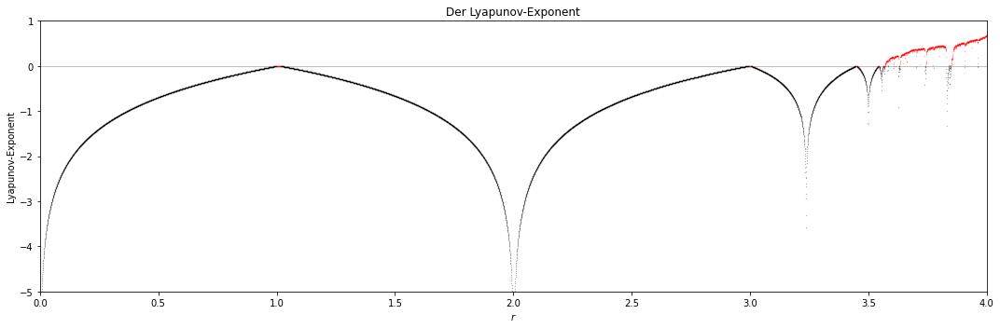

In [ ]:
#@title 
np.seterr(divide = 'ignore') 
n = 10000
r = np.linspace(0, 4.0, n)
iterations = 1000
last = 100
x = 1e-5 * np.ones(n)

lyapunov = np.zeros(n)

fig, (ax) = plt.subplots(1, 1, figsize=(15, 5),
                               sharex=True)
for i in range(iterations):
    x = r * x * (1 - x)
    lyapunov += np.log(abs(r - 2 * r * x))

ax.axhline(0, color='k', lw=.5, alpha=.5)

ax.plot(r[lyapunov < 0],
         lyapunov[lyapunov < 0] / iterations,
         '.k', alpha=.5, ms=.5)

ax.plot(r[lyapunov >= 0],
         lyapunov[lyapunov >= 0] / iterations,
         '.r', alpha=.5, ms=.5)
ax.set_xlim(0, 4)
ax.set_ylim(-5, 1)
ax.set_xlabel('$r$')
ax.set_ylabel('Lyapunov-Exponent')
ax.set_title("Der Lyapunov-Exponent")
plt.tight_layout()

### <center> Erklärung


<div align="justify "> Der Lyapunov-Exponent ist nur ein Zeitmittelwert von $\log|f'(x)|$ bei jedem Zustand, den das System im Laufe der Simulation durchläuft. Der Ausbruch von deterministischem Chaos, d. h. die Gefahr einer schnellen Divergenz zweier anfangs nahe beieinander liegender Bewegungen, wird dadurch angezeigt, dass der Lyapunov-Exponent positiv wird (Überschreiten der Nulllinie). Die Stellen im Plot, an denen der Lyapunov-Exponent zu tief negativen Werten (manchmal sogar unendlich) divergiert, zeigen extrem stabile Gleichgewichtspunkte im System mit $f'(x) \approx 0$</i></div>